[<img src="https://user-images.githubusercontent.com/79705081/109483674-d3eea600-7a7f-11eb-9a25-58c50da4cde9.png">](http://edenlibrary.ai/)

## Instructions
To run any of Eden's notebooks, please check the guides on our [Wiki page](https://github.com/Eden-Library-AI/eden_library_notebooks/wiki).<br>
There you will find instructions on how to deploy the notebooks on [your local system](https://github.com/Eden-Library-AI/eden_library_notebooks/wiki/Deploy-Notebooks-Locally), on [Google Colab](https://github.com/Eden-Library-AI/eden_library_notebooks/wiki/Deploy-Notebooks-on-GColab), or on [MyBinder](https://github.com/Eden-Library-AI/eden_library_notebooks/wiki/Deploy-Notebooks-on-MyBinder), as well as other useful links, troubleshooting tips, and more.<br>
For this notebook you will need to download the **Pepper-Capsicum_annuum-Healthy-PRX-RGB-NA-20200812-20210225103251**, datasets from [Eden Library](https://edenlibrary.ai/datasets), and you may want to use the **eden_pytorch_transfer_learning.yml** file to recreate a suitable conda environment.

**Note:** If you find any issues while executing the notebook, don't hesitate to open an issue on Github. We will try to reply as soon as possible.

## Background

In this notebook, we are going to train an autoencoder with PyTorch for removing noise from input images.

Autoencoders are a type of unsupervised neural network (i.e., no class labels or labeled data). As shown in the figure below, typically, autoencoders have two components/subnetworks:

1. **Encoder**: Accepts the input data (images) and compresses it into a smaller representation.
2. **Decoder**: The decoder is responsible for accepting the latent-space representation and then reconstructing the original input.

<img src="https://upload.wikimedia.org/wikipedia/commons/3/37/Autoencoder_schema.png" width='350'>

Autoencoders are basically a technique for data compression, similar to the way an audio file is compressed using MP3, or an image file is compressed using JPEG. The aim of the autoencoder is to find a model (weights) which will require the minimum information to encode the image such that it can be recreated on the decoder side.

If we use too few neurons in the bottleneck layer (last layer), the capacity to recreate the image will be limited and  created images could be blurry or distorted. On the other hand, if the encoder uses too many neurons, then there is no compression. 

Moreover, autoencoders are typically used for:

1. **Dimensionality reduction**: If all the activation functions used within the autoencoder are linear, the latent variables present at the bottleneck, correspond to the principal components from PCA.
2. **Denoising** (This notebook)
3. **Anomaly/outlier detection** (e.g.: detecting mislabeled data points in a dataset or detecting when an input data point falls well outside our typical data distribution).

In **agriculture**, researchers have used autoencoders for anomaly/novelty detection (Alexandridis et al., 2017) and denoising (Wen et al., 2015).

Check more highly inspirational tutorials on Autoencoders: [References](#References)

#### Library Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import random
import torch
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

from torch.optim.lr_scheduler import ReduceLROnPlateau

import os

from torchsummary import summary

print("PyTorch Version: ", torch.__version__)
print("Torchvision Version: ", torchvision.__version__)

PyTorch Version:  1.11.0
Torchvision Version:  0.12.0


#### Utility functions

In [2]:
def train_epoch_denoising(
    autoencoder, device, dataloader, optimizer, noise_factor=0.3
):
    """
    It trains the denoising autoencoder for 1 epoch.
    """
    train_loss = []
    # Set Training mode
    autoencoder.train()

    for image_batch, _ in dataloader:
        image_noisy = add_noise(image_batch, noise_factor=noise_factor)
        image_batch = image_batch.to(device)
        image_noisy = image_noisy.to(device)

        decoded_data = autoencoder(image_noisy)
        loss = ((decoded_data - image_batch)**2).sum() + autoencoder.encoder.kl

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss.append(loss.detach().cpu().numpy())
    return np.mean(train_loss)


def val_epoch_denoising(
    autoencoder, device, dataloader, noise_factor=0.3
):
    """
    It validates the denoising autoencoder for 1 epoch.
    """
    # Set evaluation mode
    autoencoder.eval()
    with torch.no_grad():  # No need to track the gradients
        outputs = []
        src_images = []
        for image_batch, _ in dataloader:
            # Adding noise
            image_noisy = add_noise(image_batch, noise_factor)
            image_noisy = image_noisy.to(device)
            # Cleaning the noisy images
            decoded_data = autoencoder(image_noisy)
            # Append the network output and the original image to the results.
            outputs.append(decoded_data.cpu())
            src_images.append(image_batch.cpu())
        # Create a single tensor with all the values.
        outputs = torch.cat(outputs)
        src_images = torch.cat(src_images)
        # Evaluate the loss of the whole validation set.
        val_loss = ((outputs - src_images)**2).sum() + autoencoder.encoder.kl

    return val_loss.data.detach().cpu().numpy()


def plot_src_images(image_batch, noise_factor):
    """
    It plots a sample of the original images with and without noise.
    """

    plt.figure(figsize=(10, 6))
    for i in range(NUM_COLUMNS_PLOT):
        plt.subplot(2, NUM_COLUMNS_PLOT, i + 1)
        img = image_batch[i].unsqueeze(0)
        if i == 0:
            plt.title("Original Images")
        plt.imshow(img.permute(0, 2, 3, 1).cpu().squeeze().numpy())
        plt.axis("off")
        image_noisy = add_noise(img, noise_factor)
        plt.subplot(2, NUM_COLUMNS_PLOT, NUM_COLUMNS_PLOT + i + 1)
        if i == 0:
            plt.title("Noisy Images")
        plt.imshow(image_noisy.permute(0, 2, 3, 1).cpu().squeeze().numpy())
        plt.axis("off")
    plt.show()


def plot_reconstructed_images(autoencoder, image_batch, noise_factor=0.3):
    """
    It plots the reconstructed images from image_batch after each iteration.
    """
    plt.figure(figsize=(10, 3))

    for i in range(NUM_COLUMNS_PLOT):
        plt.subplot(1, NUM_COLUMNS_PLOT, i + 1)
        img = image_batch[i].unsqueeze(0)
        image_noisy = add_noise(img, noise_factor)
        image_noisy = image_noisy.to(device)
        autoencoder.eval()
        with torch.no_grad():
            rec_img = autoencoder(image_noisy)
        plt.subplot(1, NUM_COLUMNS_PLOT, i + 1)
        plt.imshow(rec_img.cpu().permute(0, 2, 3, 1).squeeze().numpy())
        plt.axis("off")
        plt.axis("off")
        if i == 0:
            plt.title("Reconstructed images")
    plt.show()


def get_dataloaders():
    """
    It returns the DataLoaders necessary for training and validating.
    """
    data_transforms = transforms.Compose(
        [transforms.ToTensor(), transforms.Resize((INPUT_SIZE, INPUT_SIZE))]
    )

    # Create training and validation datasets
    image_dataset = datasets.ImageFolder(TARGET_DATA_DIR, data_transforms)
    dataset_length = len(image_dataset)
    train_dataset, val_dataset = random_split(
        image_dataset, [int(dataset_length * 0.8) + 1, int(dataset_length * 0.2)]
    )
    # Create training and validation dataloaders
    train_dataloader = DataLoader(
        train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=1
    )
    val_dataloader = DataLoader(
        train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=1
    )

    return train_dataloader, val_dataloader


def add_noise(inputs, noise_factor=0.3):
    """
    Given a batch of input images, it returns them with Gaussian noise added.
    """
    noisy = inputs + torch.randn_like(inputs) * noise_factor
    noisy = torch.clip(noisy, 0.0, 1.0)
    return noisy

#### Experimental Constants

In [3]:
# For reproducibility purposes
RANDOM_STATE = 2022
torch.manual_seed(RANDOM_STATE)
# Dataset constant
SRC_DATA_DIR = "Pepper-Capsicum_annuum-Healthy-PRX-RGB-NA-20200812-20210225103251"
TARGET_DATA_DIR = "pytorch_autoencoder_eden_data"
INPUT_SIZE = 256
LATENT_DIM = 2048
# Training constants
BATCH_SIZE = 32
NUM_EPOCHS = 500
LEARNING_RATE = 0.0005
# Experiment constant
NOISE_FACTOR = 0.3
# Visualization constant
NUM_COLUMNS_PLOT = 4

#### Defining Encoder Architecture

In [4]:
class VariationalEncoder(nn.Module):
    def __init__(self):
        super(VariationalEncoder, self).__init__()
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(3, 64, 3, stride=2, padding=1),  # 256*256*3 -> 128*128*64
            nn.ReLU(True),
            nn.Conv2d(64, 32, 3, stride=2, padding=1),  # 128*128*64 -> 64*64*32
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(32, 16, 3, stride=2, padding=1),  # 64*64*32 -> 32*32*16
            nn.ReLU(True)
        )
        self.flatten = nn.Flatten(start_dim=1)
        self.encoder_linear = nn.Linear(32*32*16, 4096)
        self.linear2 = nn.Linear(4096, LATENT_DIM)
        self.linear3 = nn.Linear(4096, LATENT_DIM)
    
        self.N = torch.distributions.Normal(0, 1)
        self.N.loc = self.N.loc.cuda()
        self.N.scale = self.N.scale.cuda()
        self.kl = 0

    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = F.relu(self.encoder_linear(x))
        mu = self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma * self.N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z

#### Defining Decoder Architecture

In [5]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        
        self.decoder_lin1 = nn.Linear(LATENT_DIM, 4096)
        self.decoder_lin2 = nn.Linear(4096, 32*32*16)
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(16, 32, 32))
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(16, 32, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 64, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 128, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 3, 3, padding=1),
        )

    def forward(self, x):
        x = self.decoder_lin1(x)
        x = self.decoder_lin2(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

#### Defining Autoencoder Architecture

In [6]:
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = VariationalEncoder()
        self.decoder = Decoder()

    def forward(self, x):
        x = self.decoder(self.encoder(x))
        return x

#### Creating Encoder, Decoder, Loss Function and Optimizer

In [7]:
autoencoder = Autoencoder()

optimizer = optim.Adam(autoencoder.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)

scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.8, verbose=True)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

autoencoder.to(device)

print(f"Selected Device: {device}")

Selected Device: cuda


#### Training / Validation Loop

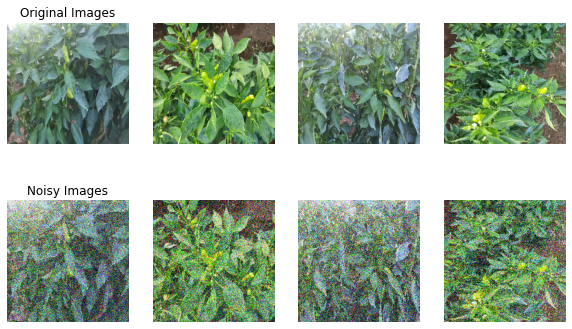


 EPOCH 1/500 	 train loss 373696864.0 	 val loss 717026048.0


<ipython-input-2-3770b542191f>:92: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, NUM_COLUMNS_PLOT, i + 1)


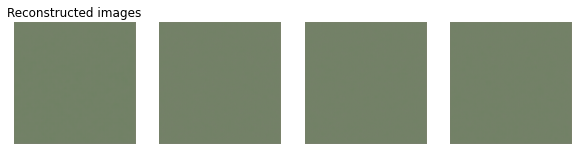


 EPOCH 2/500 	 train loss 248775.8125 	 val loss 2026543.75


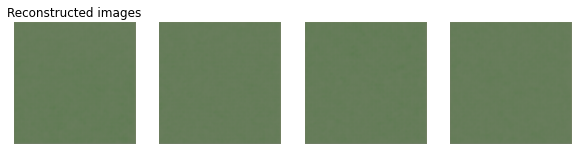


 EPOCH 3/500 	 train loss 235994.82812 	 val loss 958463552.0


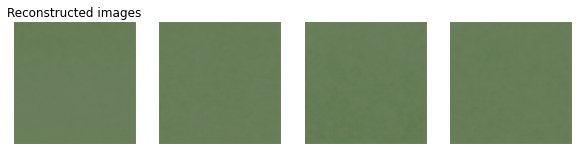


 EPOCH 4/500 	 train loss 158290656.0 	 val loss 2620774912.0


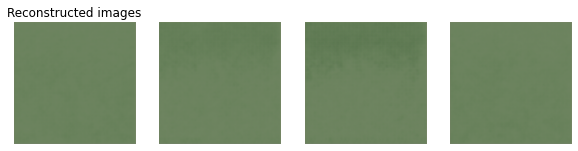


 EPOCH 5/500 	 train loss 48926192.0 	 val loss 626635904.0


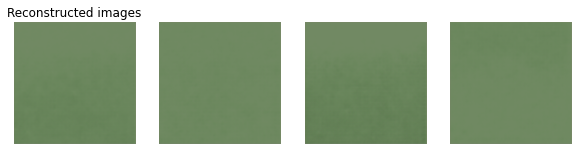


 EPOCH 6/500 	 train loss 20744736.0 	 val loss 40923256.0


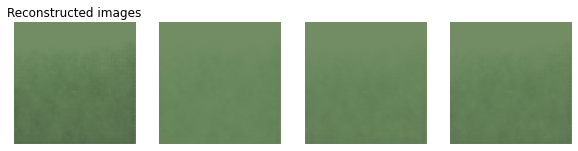


 EPOCH 7/500 	 train loss 122030832.0 	 val loss 1785515.875


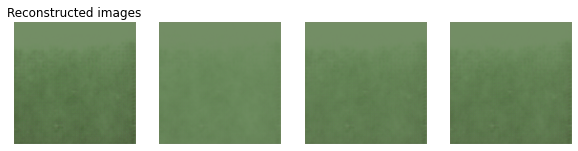


 EPOCH 8/500 	 train loss 222478.28125 	 val loss 1791760.125


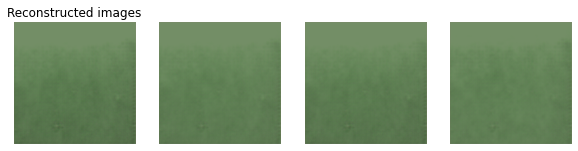


 EPOCH 9/500 	 train loss 221607.9375 	 val loss 1777560.375


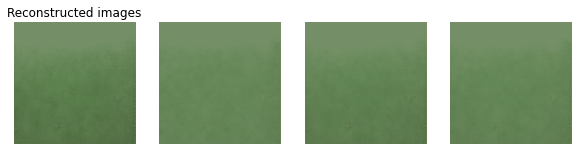


 EPOCH 10/500 	 train loss 219846.25 	 val loss 1763335.875


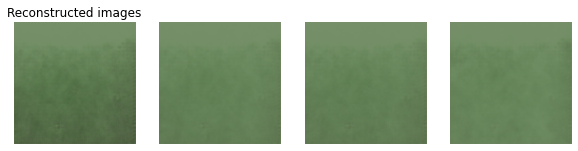


 EPOCH 11/500 	 train loss 219709.0625 	 val loss 1767019.875


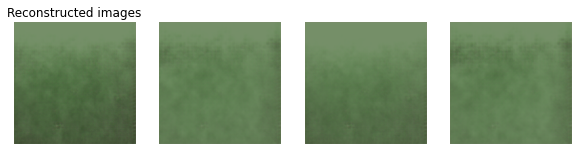


 EPOCH 12/500 	 train loss 219584.67188 	 val loss 1739637.375


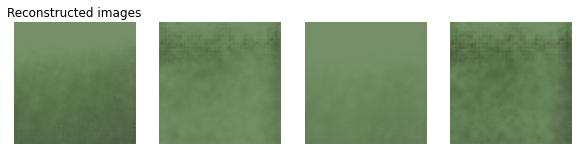


 EPOCH 13/500 	 train loss 217533.71875 	 val loss 1725781.625


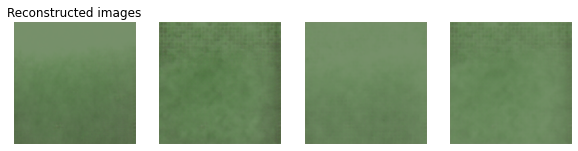


 EPOCH 14/500 	 train loss 213490.01562 	 val loss 1707972.625


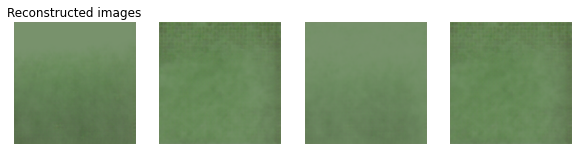


 EPOCH 15/500 	 train loss 211873.14062 	 val loss 1696047.25


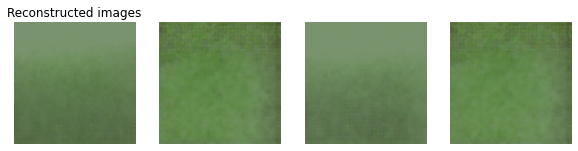


 EPOCH 16/500 	 train loss 211836.23438 	 val loss 1688732.5


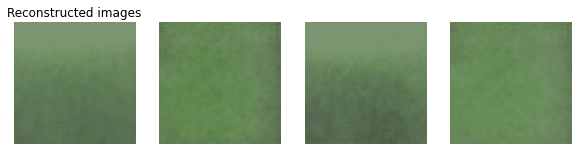


 EPOCH 17/500 	 train loss 210380.92188 	 val loss 1677160.625


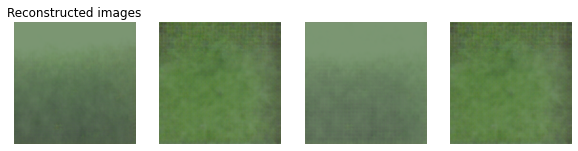


 EPOCH 18/500 	 train loss 208052.28125 	 val loss 1723167.375


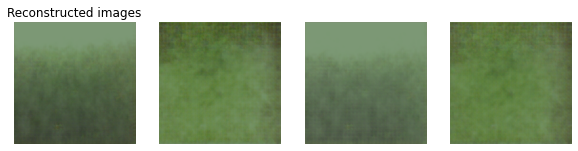


 EPOCH 19/500 	 train loss 207423.67188 	 val loss 1660636.5


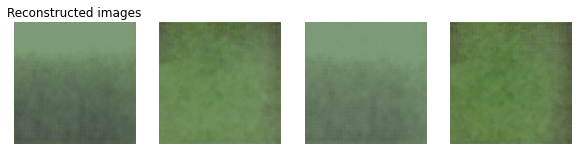


 EPOCH 20/500 	 train loss 210223.17188 	 val loss 1657221.125


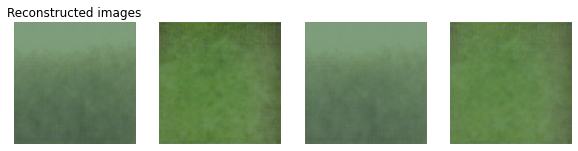


 EPOCH 21/500 	 train loss 206980.17188 	 val loss 1640449.5


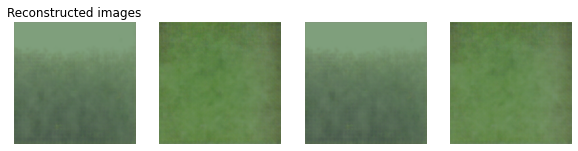


 EPOCH 22/500 	 train loss 204993.29688 	 val loss 1632740.75


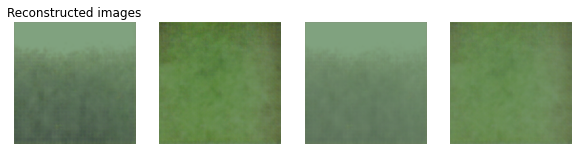


 EPOCH 23/500 	 train loss 204347.82812 	 val loss 1633921.125


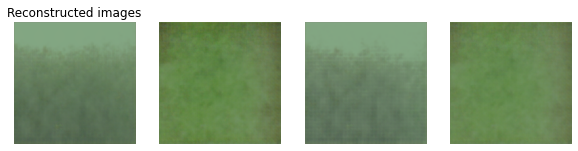


 EPOCH 24/500 	 train loss 204492.64062 	 val loss 1642965.5


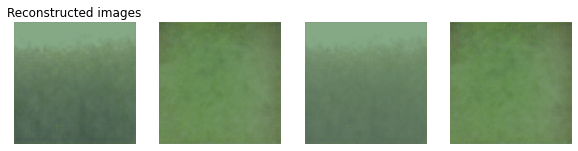


 EPOCH 25/500 	 train loss 205266.8125 	 val loss 1647128.125


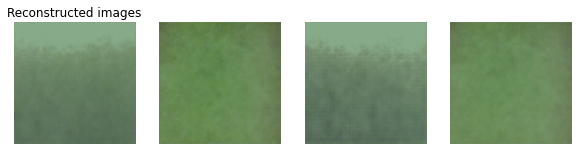


 EPOCH 26/500 	 train loss 203076.875 	 val loss 1626347.375


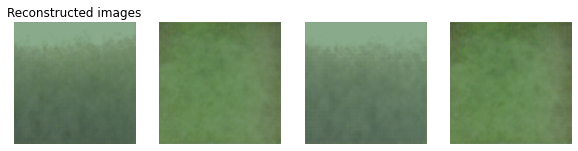


 EPOCH 27/500 	 train loss 201853.85938 	 val loss 1612688.625


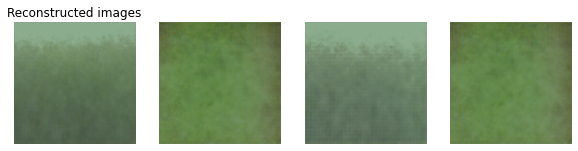


 EPOCH 28/500 	 train loss 202802.10938 	 val loss 1644407.875


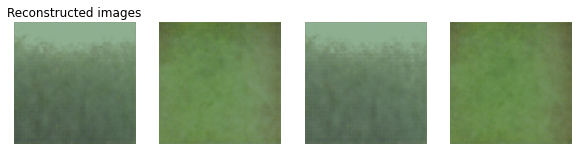


 EPOCH 29/500 	 train loss 202669.89062 	 val loss 1630492.5


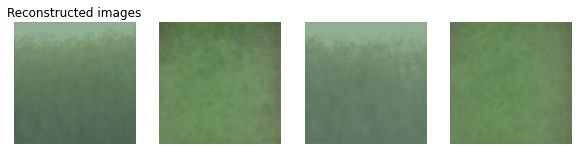


 EPOCH 30/500 	 train loss 203535.3125 	 val loss 1622374.75


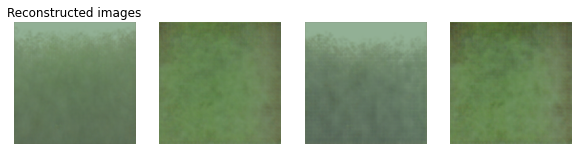


 EPOCH 31/500 	 train loss 201354.73438 	 val loss 1634770.25


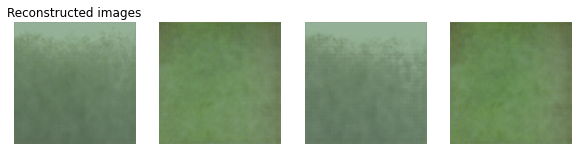


 EPOCH 32/500 	 train loss 202295.78125 	 val loss 1602088.0


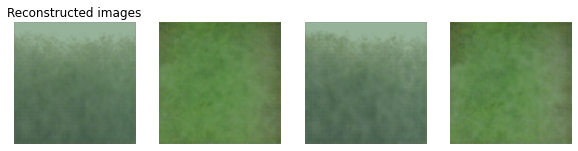


 EPOCH 33/500 	 train loss 200407.78125 	 val loss 1595454.625


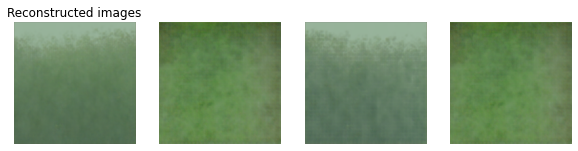


 EPOCH 34/500 	 train loss 199039.25 	 val loss 1586497.375


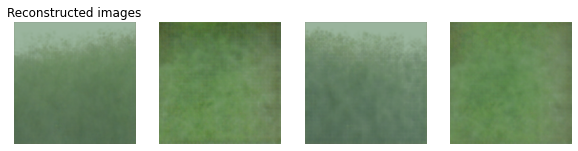


 EPOCH 35/500 	 train loss 199110.375 	 val loss 1583154.625


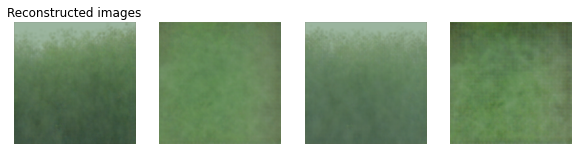


 EPOCH 36/500 	 train loss 197805.46875 	 val loss 1585816.875


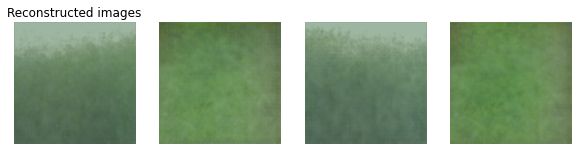


 EPOCH 37/500 	 train loss 198352.46875 	 val loss 1569322.375


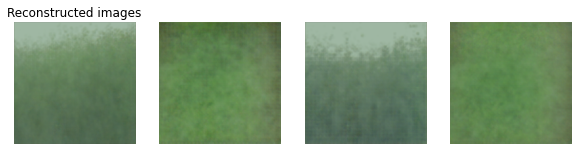


 EPOCH 38/500 	 train loss 197291.5625 	 val loss 1564468.125


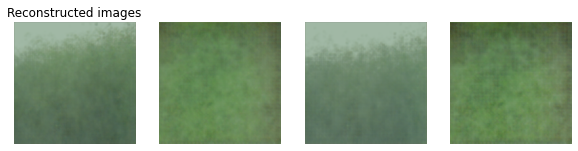


 EPOCH 39/500 	 train loss 196693.875 	 val loss 1562904.875


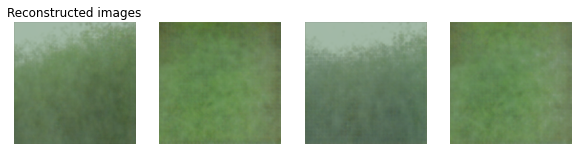


 EPOCH 40/500 	 train loss 196224.75 	 val loss 1559518.5


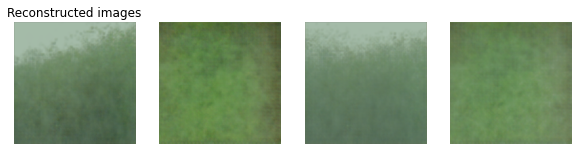


 EPOCH 41/500 	 train loss 196709.5625 	 val loss 1583093.375


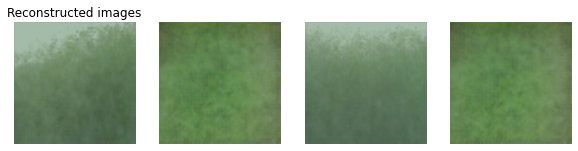


 EPOCH 42/500 	 train loss 197496.9375 	 val loss 1571889.75


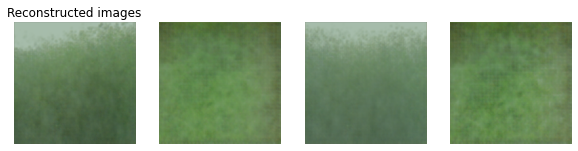


 EPOCH 43/500 	 train loss 197758.76562 	 val loss 1560187.25


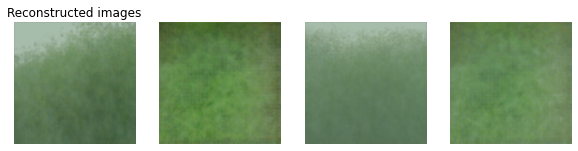


 EPOCH 44/500 	 train loss 196204.85938 	 val loss 84936256.0


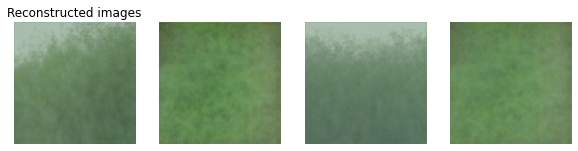


 EPOCH 45/500 	 train loss 195341.23438 	 val loss 1159526912.0


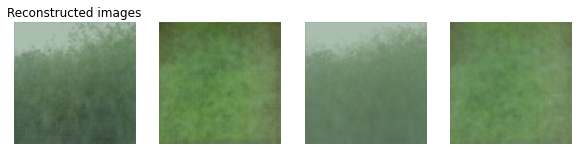


 EPOCH 46/500 	 train loss 196095.125 	 val loss 1664932608.0


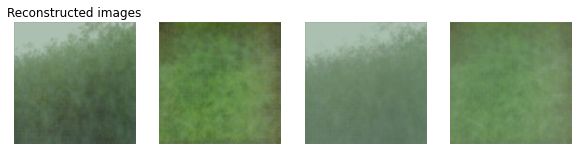


 EPOCH 47/500 	 train loss 12700554.0 	 val loss 486698880.0


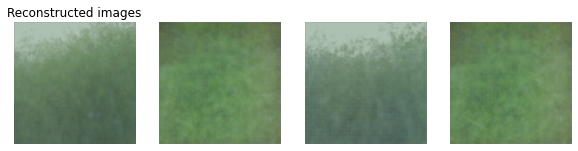


 EPOCH 48/500 	 train loss 196979.53125 	 val loss 1267601152.0


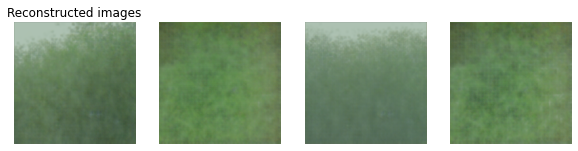


 EPOCH 49/500 	 train loss 197245.8125 	 val loss 1544856.0


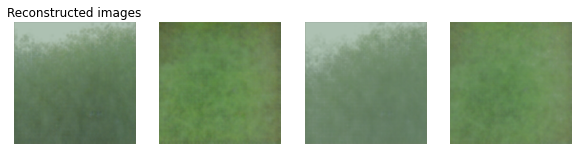


 EPOCH 50/500 	 train loss 197009.07812 	 val loss 1617603712.0


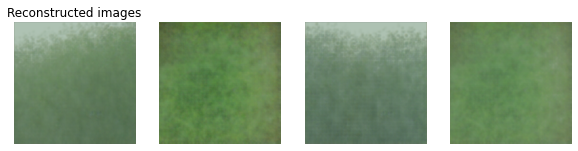


 EPOCH 51/500 	 train loss 196058.78125 	 val loss 1549353.5


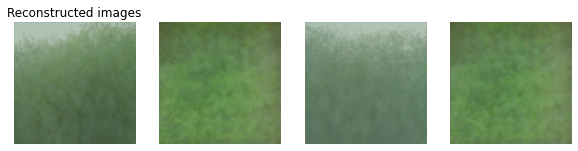


 EPOCH 52/500 	 train loss 876304.4375 	 val loss 1966610560.0


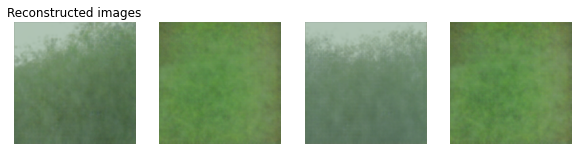


 EPOCH 53/500 	 train loss 194758.8125 	 val loss 1557084.25


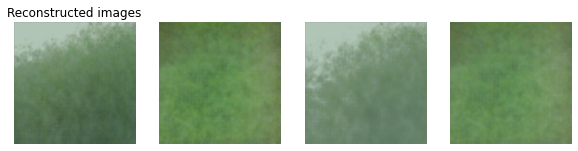


 EPOCH 54/500 	 train loss 195020.1875 	 val loss 464739264.0


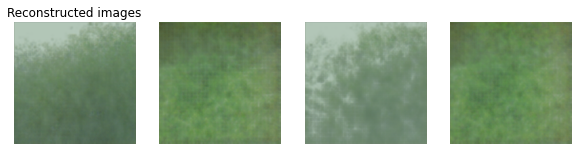


 EPOCH 55/500 	 train loss 193746.95312 	 val loss 2552619008.0


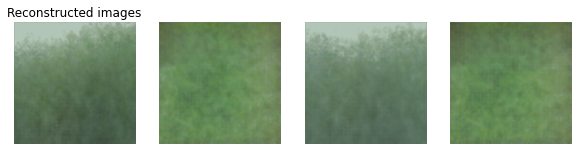


 EPOCH 56/500 	 train loss 194354.90625 	 val loss 200104496.0


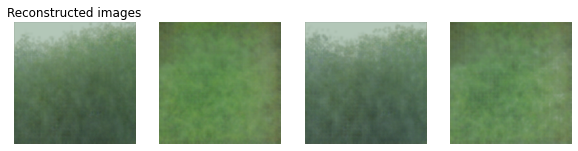


 EPOCH 57/500 	 train loss 184411120.0 	 val loss 107579944.0


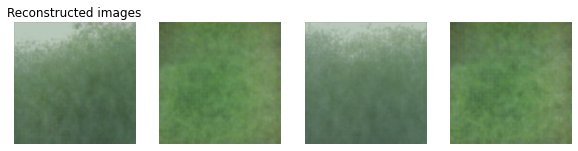


 EPOCH 58/500 	 train loss 193884.85938 	 val loss 314172064.0


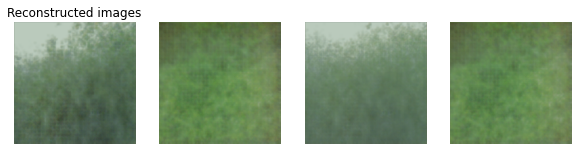


 EPOCH 59/500 	 train loss 193434.75 	 val loss 369522624.0


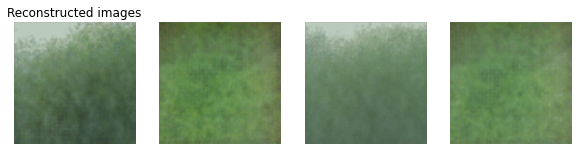

Epoch 00060: reducing learning rate of group 0 to 4.0000e-04.

 EPOCH 60/500 	 train loss 192907.65625 	 val loss 393166304.0


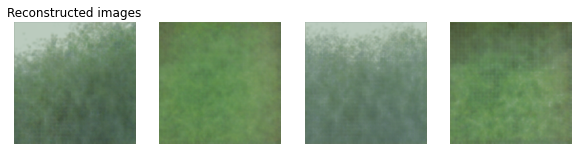


 EPOCH 61/500 	 train loss 192351.14062 	 val loss 371872000.0


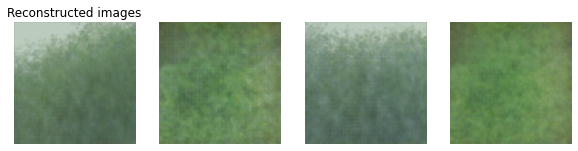


 EPOCH 62/500 	 train loss 192224.78125 	 val loss 674307456.0


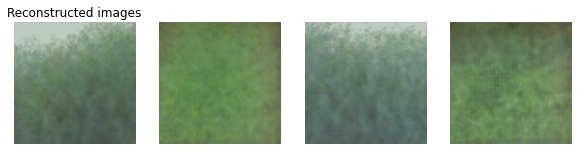


 EPOCH 63/500 	 train loss 192071.60938 	 val loss 1528458.5


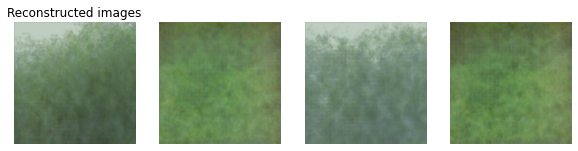


 EPOCH 64/500 	 train loss 18908472.0 	 val loss 3355269.0


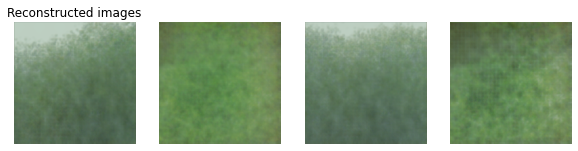


 EPOCH 65/500 	 train loss 1701070.5 	 val loss 2651032832.0


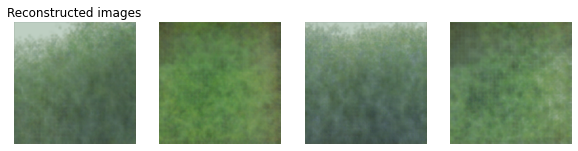


 EPOCH 66/500 	 train loss 12210459.0 	 val loss 443221824.0


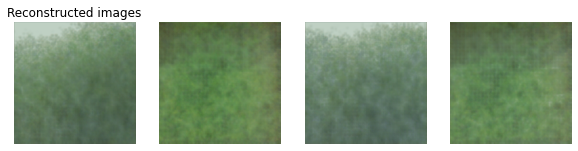


 EPOCH 67/500 	 train loss 35618200.0 	 val loss 896883840.0


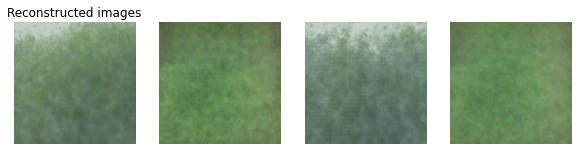


 EPOCH 68/500 	 train loss 191383.71875 	 val loss 953756032.0


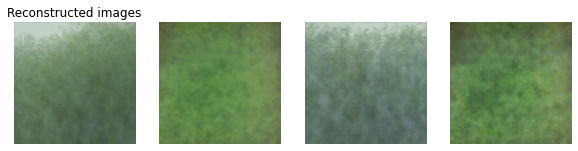


 EPOCH 69/500 	 train loss 191533.39062 	 val loss 1843799680.0


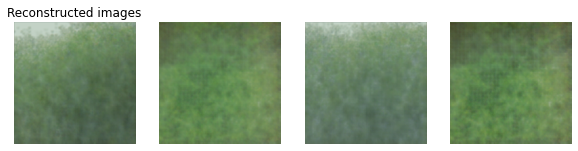


 EPOCH 70/500 	 train loss 191217.17188 	 val loss 1648443392.0


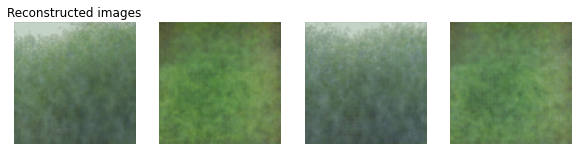


 EPOCH 71/500 	 train loss 9972742.0 	 val loss 132107464.0


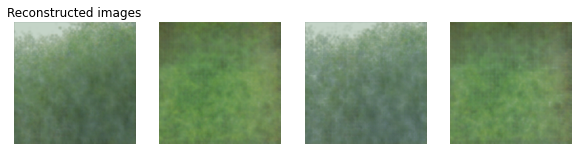


 EPOCH 72/500 	 train loss 133583872.0 	 val loss 1462062848.0


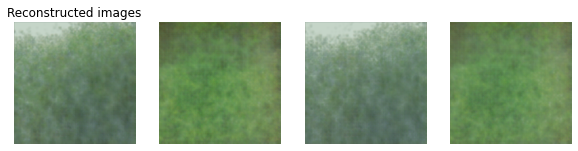


 EPOCH 73/500 	 train loss 598550.0625 	 val loss 4193209.0


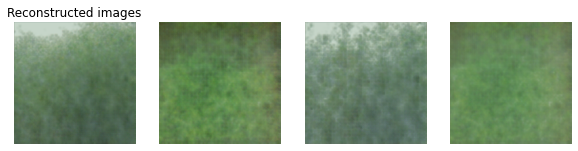

Epoch 00074: reducing learning rate of group 0 to 3.2000e-04.

 EPOCH 74/500 	 train loss 191328.85938 	 val loss 1778610048.0


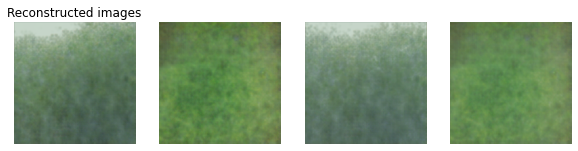


 EPOCH 75/500 	 train loss 41532912.0 	 val loss 531703392.0


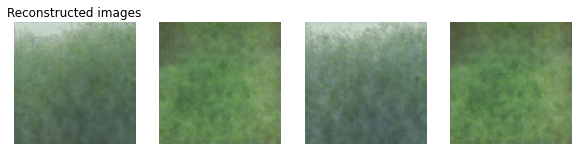


 EPOCH 76/500 	 train loss 190576.39062 	 val loss 894006592.0


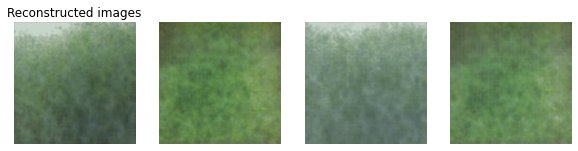


 EPOCH 77/500 	 train loss 190504.85938 	 val loss 2049388928.0


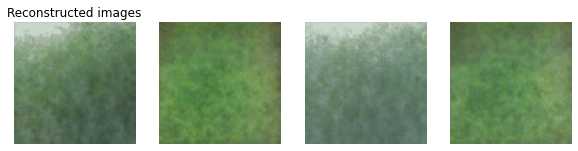


 EPOCH 78/500 	 train loss 189941.79688 	 val loss 1213756416.0


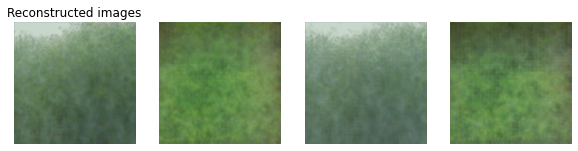


 EPOCH 79/500 	 train loss 50872292.0 	 val loss 313309728.0


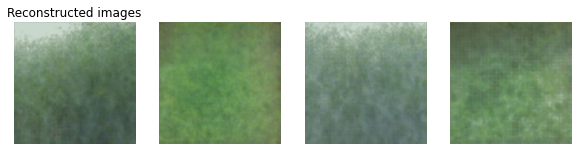


 EPOCH 80/500 	 train loss 5924892.5 	 val loss 2299951104.0


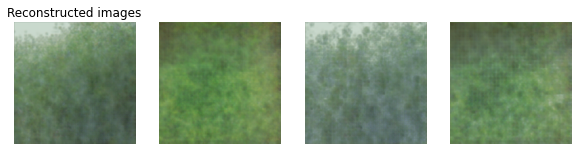


 EPOCH 81/500 	 train loss 190053.3125 	 val loss 879022912.0


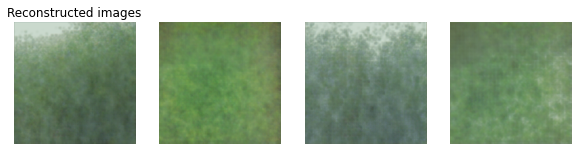


 EPOCH 82/500 	 train loss 231586352.0 	 val loss 323684192.0


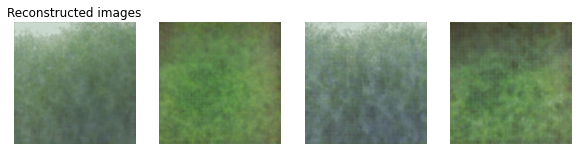


 EPOCH 83/500 	 train loss 31419410.0 	 val loss 1120641152.0


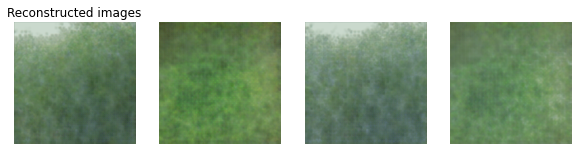


 EPOCH 84/500 	 train loss 105337504.0 	 val loss 715340736.0


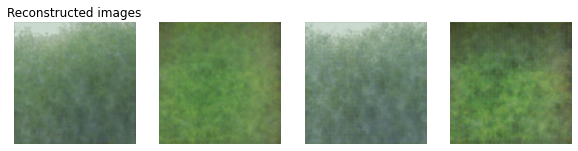

Epoch 00085: reducing learning rate of group 0 to 2.5600e-04.

 EPOCH 85/500 	 train loss 5465234.0 	 val loss 1535723008.0


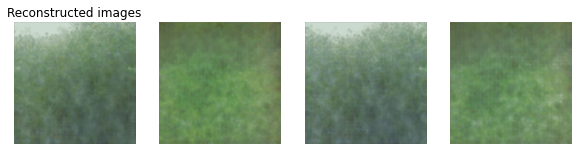


 EPOCH 86/500 	 train loss 189772.125 	 val loss 1507613.0


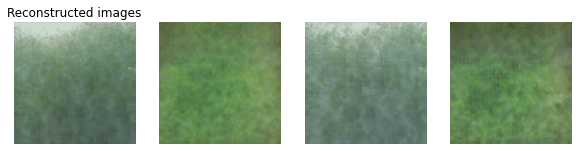


 EPOCH 87/500 	 train loss 153760976.0 	 val loss 656465280.0


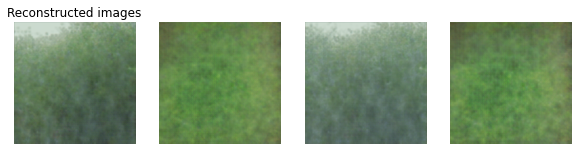


 EPOCH 88/500 	 train loss 58828336.0 	 val loss 967937088.0


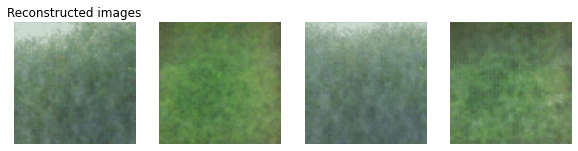


 EPOCH 89/500 	 train loss 185399456.0 	 val loss 1454899456.0


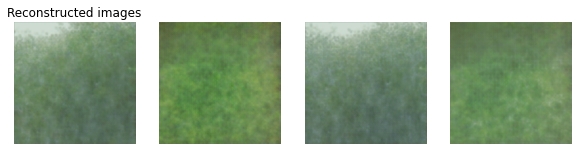


 EPOCH 90/500 	 train loss 93451480.0 	 val loss 725443264.0


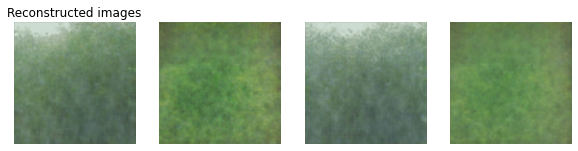


 EPOCH 91/500 	 train loss 189575.6875 	 val loss 3263690752.0


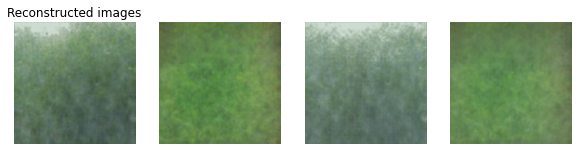


 EPOCH 92/500 	 train loss 11528043.0 	 val loss 361672256.0


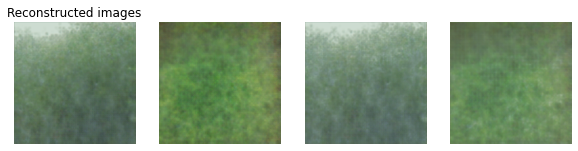


 EPOCH 93/500 	 train loss 188656.01562 	 val loss 1495393.875


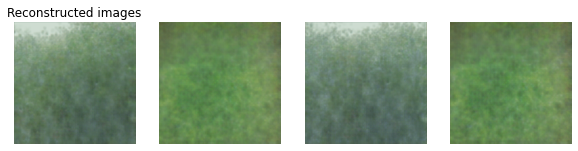


 EPOCH 94/500 	 train loss 157369392.0 	 val loss 57695564.0


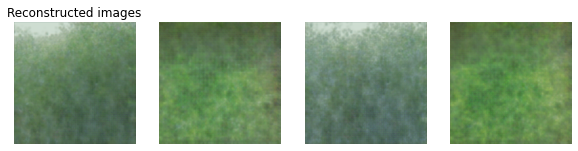


 EPOCH 95/500 	 train loss 188998.15625 	 val loss 1504126.375


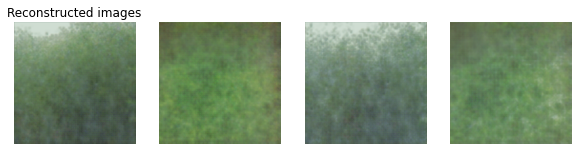


 EPOCH 96/500 	 train loss 189019.57812 	 val loss 1492897.625


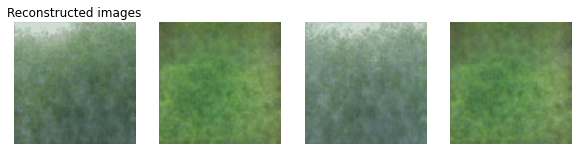


 EPOCH 97/500 	 train loss 189028.73438 	 val loss 1497111.75


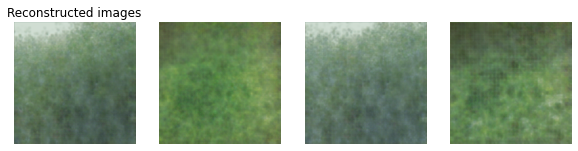


 EPOCH 98/500 	 train loss 188910.10938 	 val loss 1487869.25


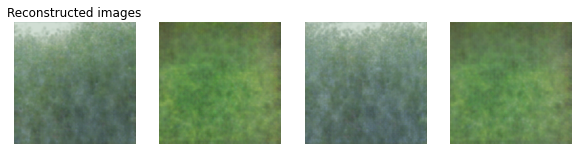


 EPOCH 99/500 	 train loss 187944.6875 	 val loss 1488341.25


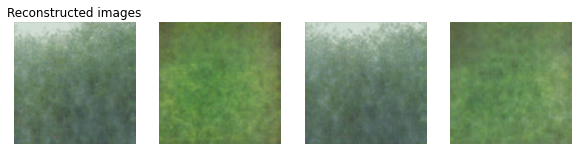


 EPOCH 100/500 	 train loss 124686576.0 	 val loss 1861821056.0


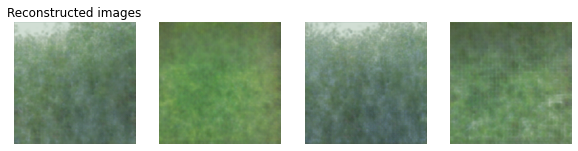


 EPOCH 101/500 	 train loss 217213744.0 	 val loss 621600320.0


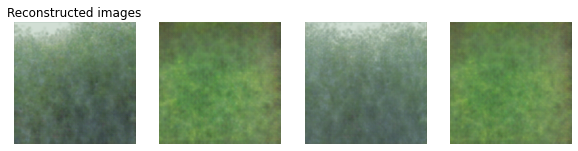


 EPOCH 102/500 	 train loss 264671552.0 	 val loss 6546929664.0


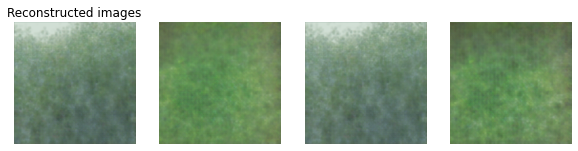


 EPOCH 103/500 	 train loss 289600000.0 	 val loss 280942880.0


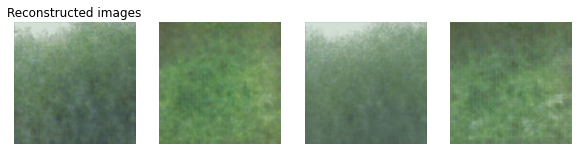


 EPOCH 104/500 	 train loss 50815132.0 	 val loss 2514422528.0


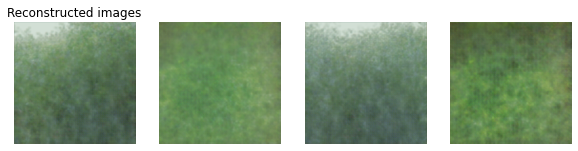


 EPOCH 105/500 	 train loss 61515136.0 	 val loss 850707392.0


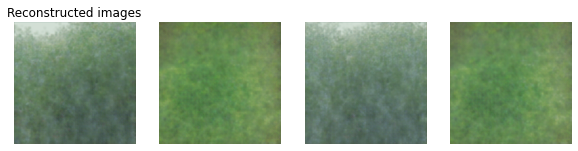


 EPOCH 106/500 	 train loss 265698112.0 	 val loss 1839487616.0


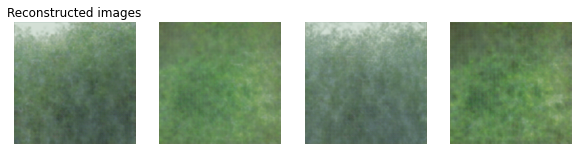


 EPOCH 107/500 	 train loss 40448352.0 	 val loss 2323416576.0


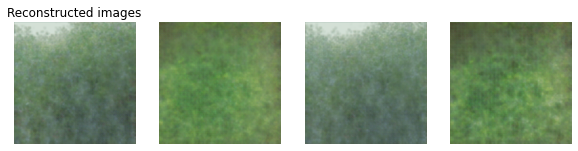


 EPOCH 108/500 	 train loss 42669524.0 	 val loss 644913920.0


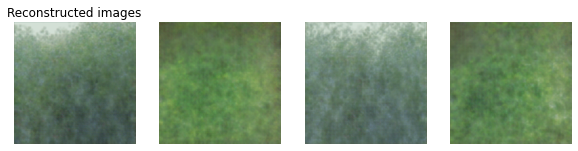

Epoch 00109: reducing learning rate of group 0 to 2.0480e-04.

 EPOCH 109/500 	 train loss 321860128.0 	 val loss 2307016448.0


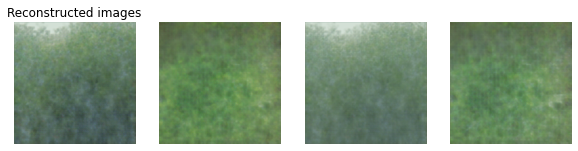


 EPOCH 110/500 	 train loss 26038632.0 	 val loss 1126782592.0


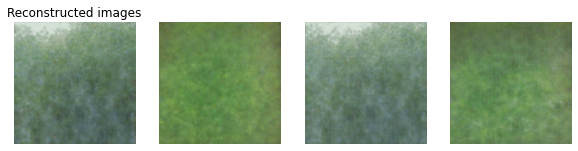


 EPOCH 111/500 	 train loss 188582.14062 	 val loss 1489488.0


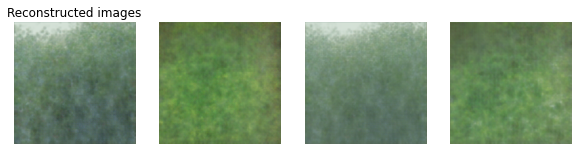


 EPOCH 112/500 	 train loss 188180.17188 	 val loss 2943527168.0


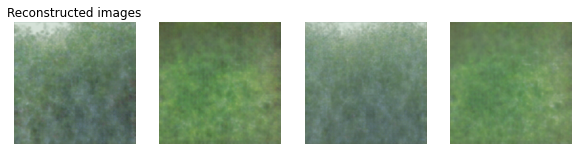


 EPOCH 113/500 	 train loss 187853.14062 	 val loss 212238432.0


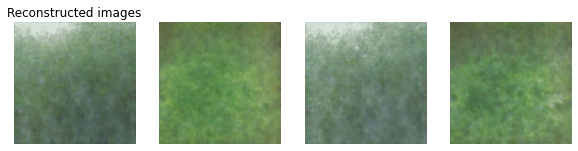


 EPOCH 114/500 	 train loss 104907944.0 	 val loss 344691872.0


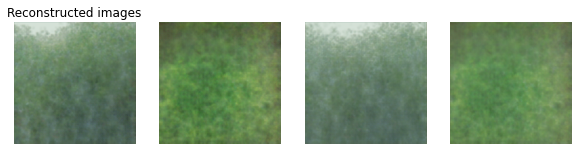


 EPOCH 115/500 	 train loss 187552.64062 	 val loss 1484236.875


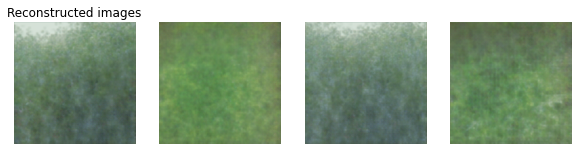


 EPOCH 116/500 	 train loss 49095280.0 	 val loss 374274336.0


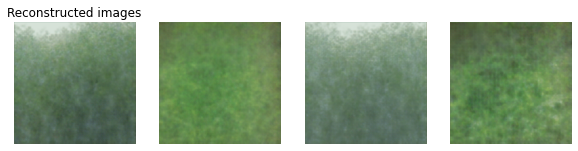


 EPOCH 117/500 	 train loss 61220296.0 	 val loss 457751264.0


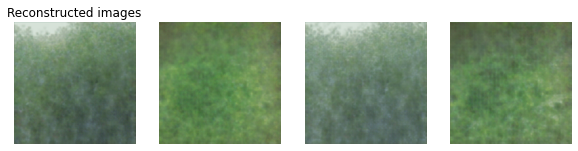


 EPOCH 118/500 	 train loss 187271.32812 	 val loss 1480961.5


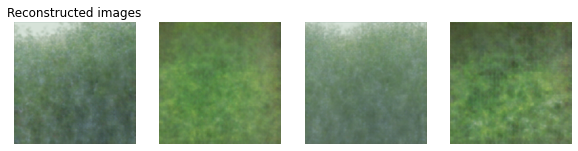


 EPOCH 119/500 	 train loss 76081056.0 	 val loss 45050508.0


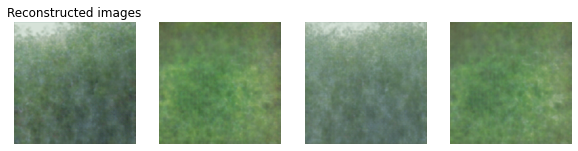


 EPOCH 120/500 	 train loss 115917480.0 	 val loss 163910256.0


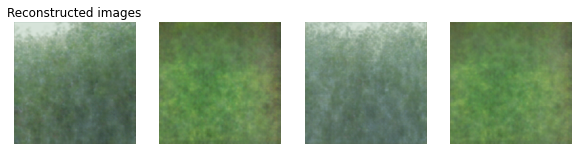


 EPOCH 121/500 	 train loss 190074016.0 	 val loss 1140713984.0


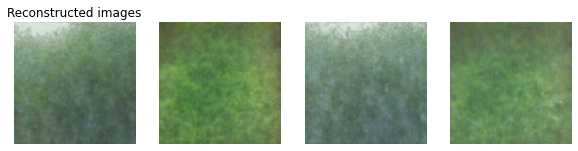


 EPOCH 122/500 	 train loss 25847094.0 	 val loss 1488199.875


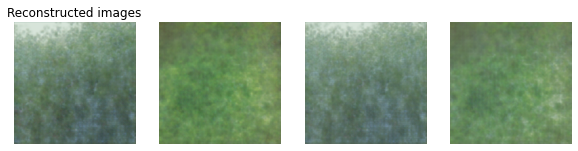


 EPOCH 123/500 	 train loss 125407584.0 	 val loss 1486483.125


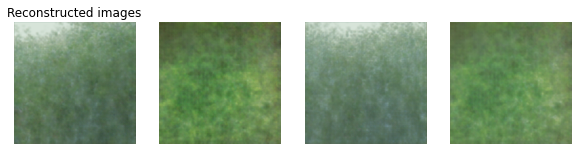


 EPOCH 124/500 	 train loss 187540.64062 	 val loss 1482389.375


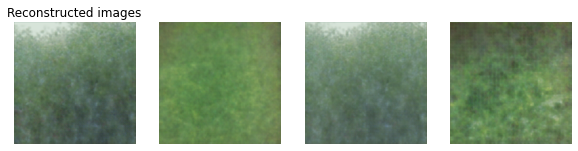


 EPOCH 125/500 	 train loss 96532424.0 	 val loss 6644022.5


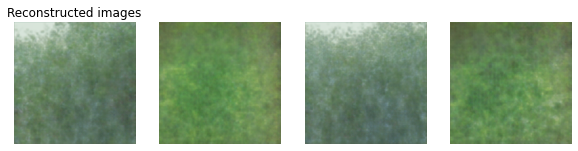


 EPOCH 126/500 	 train loss 187124.79688 	 val loss 241094752.0


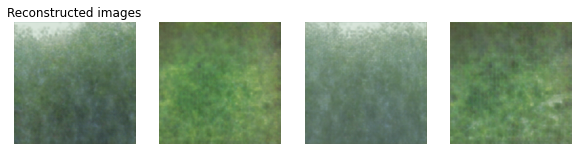


 EPOCH 127/500 	 train loss 83194416.0 	 val loss 1475556.25


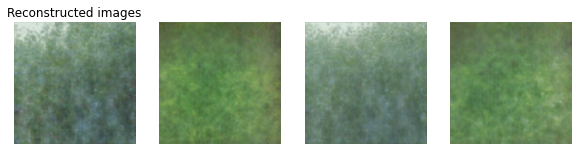


 EPOCH 128/500 	 train loss 250755104.0 	 val loss 1477491.25


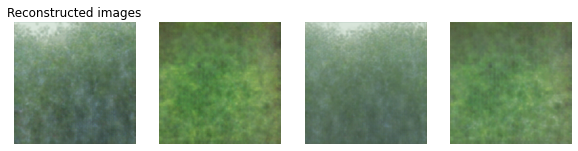


 EPOCH 129/500 	 train loss 241167248.0 	 val loss 47913848.0


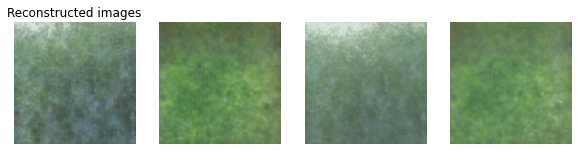


 EPOCH 130/500 	 train loss 196393808.0 	 val loss 239260576.0


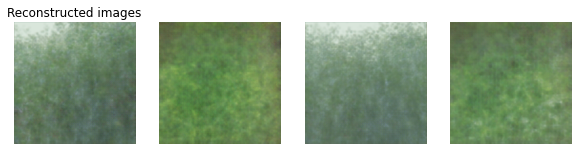


 EPOCH 131/500 	 train loss 56744856.0 	 val loss 1478664.875


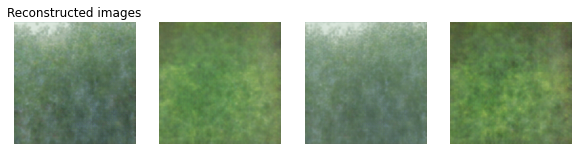


 EPOCH 132/500 	 train loss 68137864.0 	 val loss 40578692.0


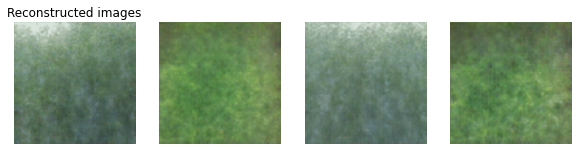

In [ ]:
history_da = {"train_loss": [], "val_loss": []}
train_dataloader, val_dataloader = get_dataloaders()
image_batch = next(iter(val_dataloader))
plot_src_images(image_batch[0], NOISE_FACTOR)
for epoch in range(NUM_EPOCHS):
    ### Training
    train_loss = train_epoch_denoising(
        autoencoder=autoencoder,
        device=device,
        dataloader=train_dataloader,
        optimizer=optimizer,
        noise_factor=NOISE_FACTOR,
    )
    ### Validation
    val_loss = val_epoch_denoising(
        autoencoder=autoencoder,
        device=device,
        dataloader=val_dataloader,
        noise_factor=NOISE_FACTOR,
    )
    scheduler.step(val_loss.item())
    history_da["train_loss"].append(train_loss)
    history_da["val_loss"].append(val_loss)

    # Print Training and Validation losses
    print(
        f"\n EPOCH {epoch + 1}/{NUM_EPOCHS} \t train loss {round(train_loss.item(), 5)} \t val loss {round(val_loss.item(), 5)}"
    )
    # Plotting Reconstructed Images
    plot_reconstructed_images(
        autoencoder, image_batch[0], noise_factor=NOISE_FACTOR
    )

## Possible Extensions
1. Change the Autoencoder architecture.
2. Use other dataset from the <a href="https://edenlibrary.ai">Eden platform</a>.
3. Change the noise factor.

## References
Alexandridis, T., Tamouridou, A.A., Pantazi, X., Lagopodi, A., Kashefi, J., Ovakoglou, G., Polychronos, V., & Moshou, D. (2017). Novelty Detection Classifiers in Weed Mapping: Silybum marianum Detection on UAV Multispectral Images. Sensors (Basel, Switzerland), 17.

Wen, C., Wu, D., Hu, H., & Pan, W. (2015). Pose estimation-dependent identification method for field moth images using deep learning architecture. Biosystems Engineering, 136, 117-128.

https://towardsdatascience.com/generating-images-with-autoencoders-77fd3a8dd368

https://ai.plainenglish.io/denoising-autoencoder-in-pytorch-on-mnist-dataset-a76b8824e57e

https://debuggercafe.com/implementing-deep-autoencoder-in-pytorch/

https://github.com/python-engineer/pytorch-examples/blob/master/Autoencoder.ipynb

https://www.geeksforgeeks.org/implementing-an-autoencoder-in-pytorch/

https://medium.com/pytorch/implementing-an-autoencoder-in-pytorch-19baa22647d1